In [289]:
import pandas as pd
import numpy as np
import seaborn as sns
import pandas_profiling as pandas_profiling

from matplotlib import pyplot as plt
import seaborn as sns

from datetime import datetime

from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split

from geopy.distance import geodesic

In [290]:
data = pd.read_csv('taxi.csv')
data

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response
0,1105373,5,20,6080,174182,55.818842,37.334562,55.814567,37.355010,-1.000,-1.000,Economy,private,0
1,759733,5,14,6080,358774,55.805342,37.515023,55.819329,37.466398,18.802,25.217,Standard,private,1
2,416977,6,14,6080,866260,55.813978,37.347688,55.814827,37.354074,6.747,9.800,Economy,private,0
3,889660,2,6,6080,163522,55.745922,37.421748,55.743469,37.431130,-1.000,-1.000,Economy,private,1
4,1120055,4,16,6080,506710,55.803578,37.521602,55.812559,37.527407,12.383,19.250,Economy,private,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,726210,0,2,2442,27360,55.961246,37.413497,55.966694,37.415754,17.378,29.817,Economy,private,0
99996,881472,0,1,2442,381960,55.961246,37.413497,55.964892,37.413543,7.751,12.683,Economy,private,0
99997,626673,1,20,2442,627126,55.961315,37.413497,55.962203,37.416373,46.983,46.217,Standard,private,0
99998,672584,6,21,2442,140623,55.961354,37.413864,55.964892,37.413543,50.029,51.100,Economy,private,0


In [291]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 14 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   offer_gk                100000 non-null  int64  
 1   weekday_key             100000 non-null  int64  
 2   hour_key                100000 non-null  int64  
 3   driver_gk               100000 non-null  int64  
 4   order_gk                100000 non-null  int64  
 5   driver_latitude         100000 non-null  float64
 6   driver_longitude        100000 non-null  float64
 7   origin_order_latitude   100000 non-null  float64
 8   origin_order_longitude  100000 non-null  float64
 9   distance_km             100000 non-null  float64
 10  duration_min            100000 non-null  float64
 11  offer_class_group       100000 non-null  object 
 12  ride_type_desc          100000 non-null  object 
 13  driver_response         100000 non-null  int64  
dtypes: float64(6), int64(

In [292]:
data.describe()

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,driver_response
count,1.000000e+05,100000.000000,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,5.662189e+05,3.159860,13.827790,3446.376360,460867.01291,55.700824,37.492292,55.772440,37.541637,18.393518,23.134841,0.492480
std,3.259360e+05,2.054222,7.306496,2038.738677,266064.98953,2.135903,1.454640,0.665985,0.467758,41.129296,33.890105,0.499946
min,4.000000e+00,0.000000,0.000000,14.000000,18.00000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000
25%,2.855552e+05,1.000000,8.000000,1421.000000,229178.50000,55.708651,37.413497,55.708032,37.407117,-1.000000,-1.000000,0.000000
50%,5.656715e+05,3.000000,16.000000,3506.500000,462420.00000,55.772904,37.533664,55.772561,37.532537,10.411500,19.700000,0.000000
75%,8.487198e+05,5.000000,20.000000,5242.000000,690894.00000,55.960667,37.624113,55.962000,37.624358,30.665250,37.867000,1.000000
max,1.130355e+06,6.000000,23.000000,6806.000000,920344.00000,56.174097,38.280547,56.311121,38.243608,5234.283000,3958.283000,1.000000


In [293]:
data.profile_report()

###### Резюме по структуре данных
1. offer_gk – идентификатор предложения: видим 100% уникальных значений, ценности для модели не представляет, удаляем
2. weekday_key – номер дня недели, начиная с воскресения: предположительно ценные данные, так как день недели может иметь вляние на работу такси; необходимо перевести в отдельный признак со значением 1/0 (опционально можно сгруппировать по признаку выходные/рабочие дни, чтобы сократить число полей)
3. hour_key – час дня: предположительно ценные данные, так как текущее время может иметь вляние на работу такси, также преобразовываем в категориальный признак, группируем по части суток, чтобы сократить число полей
4. driver_gk – уникальный номер водителя: каждый водитель теоретически может иметь свои предпочтения по работе, которые можно было бы учесть, но водителей слишком много (400+), поэтому, кажется, не очень подходит для анализа + по идее в большом масштабе индивидуальные предпочтения водителей должны обобщаться в некую среднюю тенденцию / общие предпочтения  
5. order_gk – идинтификатор заказа (предположительно в рамках заказа может быть несколько предложений водителям): видим 80% уникальных значений, ценности для модели не представляет
6. driver_latitude – координаты широты местонахождения водителя: матрица корреляции показывает, что координаты водителя влияют на результат (вероятно, связано с объемом доступных заказов, пробками и т.п.), необходимо создать категориальный параметр, который позволит учесть это влияние
7. driver_longitude – координаты долготы местонахождения водителя
8. origin_order_latitude – координаты широты местонахождения пассажира при отправке заказа
9. origin_order_longitude – координаты долготы местонахождения пассажира при отправке заказа: эти четыре поля (6-9) невозможно использовать в качестве количественных параметров, зато можно вычислить расстояние от водителя до пассажира, что может служить хорошим критерием для принятия решения водителем (далеко ли необходимо ехать, чтобы начать поездку). Имеется некоторое количество записей со значениями '-1' (~200 шт), их удалим так как число небольшое
10. distance_km – расстояние от начала поездки до места назначения: 1) есть большое число записей (~30К) со значением '-1' (место назначения не определено) и '0';  2) есть небольшое количество поездок с расстоянием более 1000 км, что вызывает вопросы. Это не позволяет использовать расстояние в качестве количественного признака. Переведем признак в категориальный со значениями: "Расстояние не определено", "0-3 км", "3-5 км", "5-10" км и т.п., чтобы сохранить информацию. Значения свыше 300 км кажутся не очень релевантными, их немного, поэтому удалим их
11. duration_min – расчетное время поездки: видим высокую степень корреляции с расстоянием поездки, кажется, в этом поле нет необходимост, удаляем 
12. offer_class_group – класс заказа (экономический, бизнес, VIP и т.п.): распеределение по категориям неравномерное, есть очень небольшие категории (VIP, VIP+, XL), возможно их стоит объединить в категорию "прочие", по крайней мере для начала объединим VIP и VIP+, а также удалим категорию 'Test'
13. ride_type_desc – тип поездки (частная, корпоративная): есть небольшая категория SMB, всего 36 записей, удалим их, чтобы сократить число полей
14. driver_response – индикатор решения водителя взять заказ, целевое значение модели 


###### 1. Weekday, hour
Преобразуем поле 'hour_key' в катериальный признак, укрупняем до времени суток, чтобы не создавать 20 лишних полей

In [294]:
def get_day_part(row):
    if (row['hour_key'] == 23) or (row['hour_key'] >= 0 and row['hour_key'] <= 6):
        return 'night'
    if row['hour_key'] >= 7 and row['hour_key'] <= 16:
        return 'day'
    if (row['hour_key'] >= 17 and row['hour_key'] <= 22):
        return 'evening'
    return 'undefined'

data['day_part'] = data.apply(get_day_part, axis=1)

oh_enc = OneHotEncoder()
ohe_day_part = oh_enc.fit_transform(data[['day_part']]).toarray()
ohe_day_part = pd.DataFrame(ohe_day_part, columns=oh_enc.categories_[0])

data = data.reset_index(drop=True)
data = data.join(ohe_day_part)

data.drop(['day_part'], axis=1, inplace=True)


Поле 'weekday_key' по сути уже категориальный признак, переименуем его значения, чтобы иметь более приятные названия полей

In [295]:
def get_weekday(row):
    if row['weekday_key'] == 0:
        return 'Sun'
    if row['weekday_key'] == 1:
        return 'Mon'
    if row['weekday_key'] == 2:
        return 'Tue'
    if row['weekday_key'] == 3:
        return 'Wed'
    if row['weekday_key'] == 4:
        return 'Thu'
    if row['weekday_key'] == 5:
        return 'Fri'
    if row['weekday_key'] == 6:
        return 'Sat'

    return 'undefined'

data['weekday'] = data.apply(get_weekday, axis=1)

oh_enc = OneHotEncoder()
ohe_weekday = oh_enc.fit_transform(data[['weekday']]).toarray()
ohe_weekday = pd.DataFrame(ohe_weekday, columns=oh_enc.categories_[0])

data = data.reset_index(drop=True)
data = data.join(ohe_weekday)

data.drop(['weekday'], axis=1, inplace=True)
data

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,...,day,evening,night,Fri,Mon,Sat,Sun,Thu,Tue,Wed
0,1105373,5,20,6080,174182,55.818842,37.334562,55.814567,37.355010,-1.000,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,759733,5,14,6080,358774,55.805342,37.515023,55.819329,37.466398,18.802,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,416977,6,14,6080,866260,55.813978,37.347688,55.814827,37.354074,6.747,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,889660,2,6,6080,163522,55.745922,37.421748,55.743469,37.431130,-1.000,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,1120055,4,16,6080,506710,55.803578,37.521602,55.812559,37.527407,12.383,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,726210,0,2,2442,27360,55.961246,37.413497,55.966694,37.415754,17.378,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
99996,881472,0,1,2442,381960,55.961246,37.413497,55.964892,37.413543,7.751,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
99997,626673,1,20,2442,627126,55.961315,37.413497,55.962203,37.416373,46.983,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
99998,672584,6,21,2442,140623,55.961354,37.413864,55.964892,37.413543,50.029,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


###### 2. driver_latitude, driver_longitude,  origin_order_latitude, origin_order_longitude
Уберем некорректные значения, рассчитаем расстояние от пассажира до водителя при отправке заказа

In [296]:
def get_origin_distance(row):
    driver = (row['driver_latitude'],row['driver_longitude'])
    origin = (row['origin_order_latitude'],row['origin_order_longitude'])

    # Нормируем по максимальному расстоянию
    return geodesic(driver, origin).kilometers / 22.358    

data = data[data['driver_latitude'] > 0]
data = data[data['origin_order_latitude'] > 0]

data['origin_distance'] = data.apply(get_origin_distance, axis=1)


Посмотрим на графическое отображение точек, которое по сути отражает карту города (Москвы)

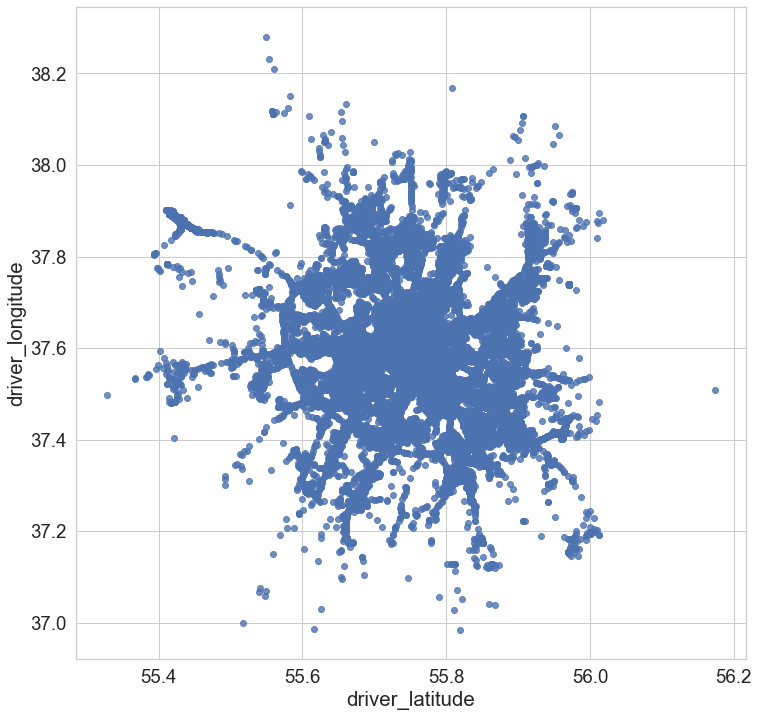

In [297]:
plot_data = data[data['driver_latitude'] > 0 ]
sns.regplot(x= plot_data.driver_latitude, y=plot_data.driver_longitude, data=plot_data, fit_reg=False)
fig=plt.gcf()
fig.set_size_inches(12,12)
plt.show()

Чтобы учесть влияние местоположения разобьем нашу "карту" на квадраты, которые обозначим A1...X0. Возможно, есть более точное разделение (например по районам), но такой подход тоже должен позволить отделить центральные районы города от пригородов.

In [298]:
def get_longitude_quadrant(longitude):
    if longitude >= 37.3 and longitude < 37.4:
        return "A"
    if longitude >= 37.4 and longitude < 37.5:
        return "B"
    if longitude >= 37.5 and longitude < 37.6:
        return "C"
    if longitude >= 37.6 and longitude < 37.7:
        return "D"
    if longitude >= 37.7 and longitude < 37.8:
        return "E"
    if longitude >= 37.8 and longitude <= 37.9:
        return "F"
    if longitude < 37.3 or longitude > 37.9:
        return "X"

def get_latitude_quadrant(latitude):
    if latitude >= 55.5 and latitude < 55.6:
        return "1"
    if latitude >= 55.6 and latitude < 55.7:
        return "2"
    if latitude >= 55.7 and latitude < 55.8:
        return "3"
    if latitude >= 55.8 and latitude <= 55.9:
        return "4"
    if latitude < 55.5 or latitude > 55.9:
        return "0"
    
def get_loc_quadrant(row):
    longitude_quadrant = get_longitude_quadrant(row['driver_longitude'])
    latitude_quadrant = get_latitude_quadrant(row['driver_latitude'])
    return longitude_quadrant + latitude_quadrant
    
# def get_center_loc(row):
#     if (row['driver_longitude'] >= 37.5 and row['driver_longitude'] <= 37.7) and (row['driver_latitude'] >= 55.7 and row['driver_latitude'] <= 55.85):
#         return 1
#     else:
#         return 0
    
data['loc_quadrant'] = data.apply(get_loc_quadrant, axis=1)

oh_enc = OneHotEncoder()
ohe_loc_quadrant = oh_enc.fit_transform(data[['loc_quadrant']]).toarray()
ohe_loc_quadrant = pd.DataFrame(ohe_loc_quadrant, columns=oh_enc.categories_[0])

data = data.reset_index(drop=True)
data = data.join(ohe_loc_quadrant)

data.drop(['loc_quadrant'], axis=1, inplace=True)
data


,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,...,F0,F1,F2,F3,F4,X0,X1,X2,X3,X4
0,1105373,5,20,6080,174182,55.818842,37.334562,55.814567,37.355010,-1.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,759733,5,14,6080,358774,55.805342,37.515023,55.819329,37.466398,18.802,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,416977,6,14,6080,866260,55.813978,37.347688,55.814827,37.354074,6.747,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,889660,2,6,6080,163522,55.745922,37.421748,55.743469,37.431130,-1.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1120055,4,16,6080,506710,55.803578,37.521602,55.812559,37.527407,12.383,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99841,726210,0,2,2442,27360,55.961246,37.413497,55.966694,37.415754,17.378,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
99842,881472,0,1,2442,381960,55.961246,37.413497,55.964892,37.413543,7.751,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
99843,626673,1,20,2442,627126,55.961315,37.413497,55.962203,37.416373,46.983,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
99844,672584,6,21,2442,140623,55.961354,37.413864,55.964892,37.413543,50.029,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


###### 3. distance_km
Преобразуем поле 'distance_km' в категориальный признак, заменим значения '-1' и '0' на 'Undefined'

In [299]:
def get_distance_cat(row):
    if row['distance_km'] == -1:
        return 'Undef_km'
    if row['distance_km'] == 0:
        return 'Undef_km'
    if row['distance_km'] > 0 and row['distance_km'] <= 5:
        return '0-5km'
    if row['distance_km'] > 5 and row['distance_km'] <= 10:
        return '5-10km'
    if row['distance_km'] > 10 and row['distance_km'] <= 20:
        return '10-20km'
    if row['distance_km'] > 20 and row['distance_km'] <= 40:
        return '20-40km'
    if row['distance_km'] > 40 and row['distance_km'] <= 60:
        return '40-60km'
    if row['distance_km'] > 60:
        return '60+km'

    return 'Undef_km'


data = data[data['distance_km'] <= 300]

data['distance_cat'] = data.apply(get_distance_cat, axis=1)

oh_enc = OneHotEncoder()
ohe_distance_cat = oh_enc.fit_transform(data[['distance_cat']]).toarray()
ohe_distance_cat = pd.DataFrame(ohe_distance_cat, columns=oh_enc.categories_[0])

data = data.reset_index(drop=True)
data = data.join(ohe_distance_cat)

data.drop(['distance_cat'], axis=1, inplace=True)
data

C:\Users\Peter\anaconda3\lib\site-packages\ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,...,X2,X3,X4,0-5km,10-20km,20-40km,40-60km,5-10km,60+km,Undef_km
0,1105373,5,20,6080,174182,55.818842,37.334562,55.814567,37.355010,-1.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,759733,5,14,6080,358774,55.805342,37.515023,55.819329,37.466398,18.802,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,416977,6,14,6080,866260,55.813978,37.347688,55.814827,37.354074,6.747,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,889660,2,6,6080,163522,55.745922,37.421748,55.743469,37.431130,-1.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,1120055,4,16,6080,506710,55.803578,37.521602,55.812559,37.527407,12.383,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99780,726210,0,2,2442,27360,55.961246,37.413497,55.966694,37.415754,17.378,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
99781,881472,0,1,2442,381960,55.961246,37.413497,55.964892,37.413543,7.751,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
99782,626673,1,20,2442,627126,55.961315,37.413497,55.962203,37.416373,46.983,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
99783,672584,6,21,2442,140623,55.961354,37.413864,55.964892,37.413543,50.029,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


###### 4. offer_class_group
Заменим категориальный признак на соответствующие бинарные поля, уберем лишние значения

In [300]:
data['offer_class_group'].value_counts()

Economy     48294
Standard    47128
Premium      1769
Delivery     1286
Kids          587
XL            462
VIP           222
VIP+           29
Test            8
Name: offer_class_group, dtype: int64

In [301]:
def upd_class(row):
    if row['offer_class_group'] == 'Kids':
        return 'Other'
    if row['offer_class_group'] == 'XL':
        return 'Other'
    if row['offer_class_group'] == 'VIP':
        return 'Other'
    if row['offer_class_group'] == 'VIP+':
        return 'Other'
    if row['offer_class_group'] == 'Delivery':
        return 'Other'

    return row['offer_class_group']

data = data.drop(np.where(data['offer_class_group'] == 'Test')[0])
    
data['offer_class_group'] = data.apply(upd_class, axis=1)

oh_enc = OneHotEncoder()
ohe_offer_class_group = oh_enc.fit_transform(data[['offer_class_group']]).toarray()
ohe_offer_class_group = pd.DataFrame(ohe_offer_class_group, columns=oh_enc.categories_[0])

data = data.reset_index(drop=True)
data = data.join(ohe_offer_class_group)

data.drop(['offer_class_group'], axis=1, inplace=True)
data

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,...,10-20km,20-40km,40-60km,5-10km,60+km,Undef_km,Economy,Other,Premium,Standard
0,1105373,5,20,6080,174182,55.818842,37.334562,55.814567,37.355010,-1.000,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
1,759733,5,14,6080,358774,55.805342,37.515023,55.819329,37.466398,18.802,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,416977,6,14,6080,866260,55.813978,37.347688,55.814827,37.354074,6.747,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
3,889660,2,6,6080,163522,55.745922,37.421748,55.743469,37.431130,-1.000,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
4,1120055,4,16,6080,506710,55.803578,37.521602,55.812559,37.527407,12.383,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99772,726210,0,2,2442,27360,55.961246,37.413497,55.966694,37.415754,17.378,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
99773,881472,0,1,2442,381960,55.961246,37.413497,55.964892,37.413543,7.751,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
99774,626673,1,20,2442,627126,55.961315,37.413497,55.962203,37.416373,46.983,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
99775,672584,6,21,2442,140623,55.961354,37.413864,55.964892,37.413543,50.029,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


###### 5. ride_type_desc
Заменим категориальный признак на соответствующие бинарные поля, уберем лишние значения

In [302]:
data['ride_type_desc'].value_counts()

private      91122
business      8403
affiliate      224
SMB             28
Name: ride_type_desc, dtype: int64

In [303]:
data = data.drop(np.where(data['ride_type_desc'] == 'SMB')[0])
data = data.drop(np.where(data['ride_type_desc'] == 'affiliate')[0])

oh_enc = OneHotEncoder()
ohe_ride_type_desc = oh_enc.fit_transform(data[['ride_type_desc']]).toarray()
ohe_ride_type_desc = pd.DataFrame(ohe_ride_type_desc, columns=oh_enc.categories_[0])

data = data.reset_index(drop=True)
data = data.join(ohe_ride_type_desc)

data.drop(['ride_type_desc'], axis=1, inplace=True)
data

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,...,5-10km,60+km,Undef_km,Economy,Other,Premium,Standard,affiliate,business,private
0,1105373,5,20,6080,174182,55.818842,37.334562,55.814567,37.355010,-1.000,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
1,759733,5,14,6080,358774,55.805342,37.515023,55.819329,37.466398,18.802,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,416977,6,14,6080,866260,55.813978,37.347688,55.814827,37.354074,6.747,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
3,889660,2,6,6080,163522,55.745922,37.421748,55.743469,37.431130,-1.000,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
4,1120055,4,16,6080,506710,55.803578,37.521602,55.812559,37.527407,12.383,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99520,726210,0,2,2442,27360,55.961246,37.413497,55.966694,37.415754,17.378,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
99521,881472,0,1,2442,381960,55.961246,37.413497,55.964892,37.413543,7.751,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
99522,626673,1,20,2442,627126,55.961315,37.413497,55.962203,37.416373,46.983,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
99523,672584,6,21,2442,140623,55.961354,37.413864,55.964892,37.413543,50.029,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0


###### 5. Удалим лишние поля

In [304]:
data.drop(['offer_gk'], axis=1, inplace=True)
data.drop(['weekday_key'], axis=1, inplace=True)
data.drop(['hour_key'], axis=1, inplace=True)
data.drop(['driver_gk'], axis=1, inplace=True)
data.drop(['order_gk'], axis=1, inplace=True)
data.drop(['driver_latitude'], axis=1, inplace=True)
data.drop(['driver_longitude'], axis=1, inplace=True)
data.drop(['origin_order_latitude'], axis=1, inplace=True)
data.drop(['origin_order_longitude'], axis=1, inplace=True)
data.drop(['distance_km'], axis=1, inplace=True)
data.drop(['duration_min'], axis=1, inplace=True)
data


,driver_response,day,evening,night,Fri,Mon,Sat,Sun,Thu,Tue,...,5-10km,60+km,Undef_km,Economy,Other,Premium,Standard,affiliate,business,private
0,0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
1,1,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
3,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
4,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99520,0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
99521,0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
99522,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
99523,0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0


###### 6. Разделим выборку на обучаемую и тестовую

In [305]:
X = data.drop('driver_response', axis=1)  
y = data['driver_response'] 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state = 2020, stratify=y)

###### 7. Обучим модель

In [306]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import recall_score
rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)
print(rfc.score(X_train, y_train))

0.9861914536294085


###### 8. Оценим значимость параметров

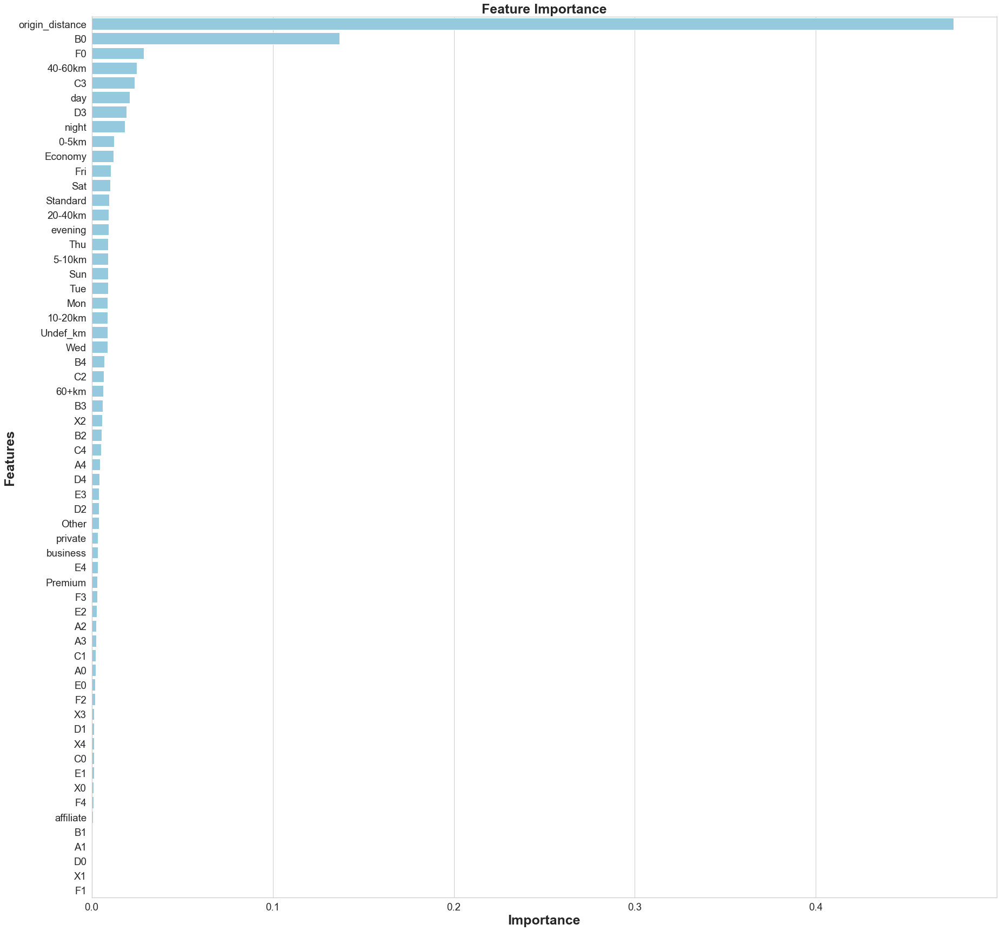

None

,Features,Gini-Importance
0,origin_distance,0.476022
1,B0,0.136987
2,F0,0.028762
3,40-60km,0.024849
4,C3,0.023803
5,day,0.021011
6,D3,0.019265
7,night,0.018256
8,0-5km,0.012222
9,Economy,0.012125


In [307]:
feats = {}
for feature, importance in zip(X.columns, rfc.feature_importances_):
    feats[feature] = importance
importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gini-Importance'})
importances = importances.sort_values(by='Gini-Importance', ascending=False)
importances = importances.reset_index()
importances = importances.rename(columns={'index': 'Features'})
sns.set(font_scale = 5)
sns.set(style="whitegrid", color_codes=True, font_scale = 1.7)
fig, ax = plt.subplots()
fig.set_size_inches(30,30)
sns.barplot(x=importances['Gini-Importance'], y=importances['Features'], data=importances, color='skyblue')
plt.xlabel('Importance', fontsize=25, weight = 'bold')
plt.ylabel('Features', fontsize=25, weight = 'bold')
plt.title('Feature Importance', fontsize=25, weight = 'bold')
display(plt.show())
display(importances)

Оценим ошибки предсказаний

In [308]:
y_pred = rfc.predict(X_test)

from sklearn.metrics import confusion_matrix
conf_matrix_baseline = pd.DataFrame(confusion_matrix(y_test, y_pred), index = ['actual 0', 'actual 1'], columns = ['predicted 0', 'predicted 1'])
display(conf_matrix_baseline)
display('Baseline Random Forest recall score', recall_score(y_test, y_pred))        

,predicted 0,predicted 1
actual 0,10821,4360
actual 1,4112,10565


'Baseline Random Forest recall score'

0.719833753491858

Попробуем добиться лучшего результата, отмасштабировав данные

In [312]:
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
X_train_scaled = ss.fit_transform(X_train)
X_test_scaled = ss.transform(X_test)
y_train = np.array(y_train)

In [313]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import recall_score
rfc = RandomForestClassifier()
rfc.fit(X_train_scaled, y_train)
display(rfc.score(X_train_scaled, y_train))

0.9862488696226334

In [314]:
y_pred = rfc.predict(X_test_scaled)

from sklearn.metrics import confusion_matrix
conf_matrix_baseline = pd.DataFrame(confusion_matrix(y_test, y_pred), index = ['actual 0', 'actual 1'], columns = ['predicted 0', 'predicted 1'])
display(conf_matrix_baseline)

,predicted 0,predicted 1
actual 0,10813,4368
actual 1,4079,10598
